<a href="https://colab.research.google.com/github/Nikerlas/ImageProcess/blob/main/Jobsheet02_ImageProcess.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#JOBSHEET 2 IMAGE PROCESSING<br>Nicholas Ernesto A.A. - TI-2B - 4.33.23.1.19

##P1. Deteksi Tepi menggunakan operator sobel

In [83]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

###Sobel Grayscale

In [84]:
image = data.coins()
gray_image = color.rgb2gray(image) if image.ndim == 3 else image

In [85]:
sobel_x = filters.sobel_h(gray_image)
sobel_y = filters.sobel_v(gray_image)
sobel_edge = filters.sobel(gray_image)

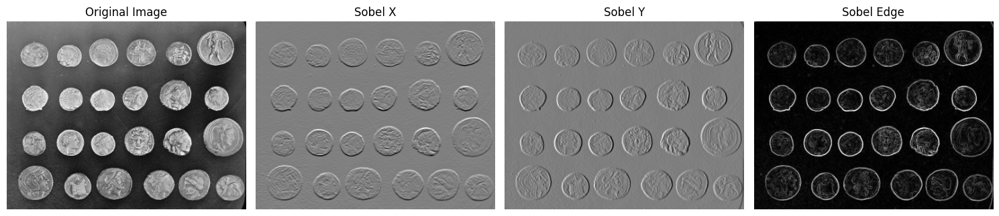

In [86]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
ax = axes.ravel()

ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title('Sobel X')
ax[1].axis('off')

ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title('Sobel Y')
ax[2].axis('off')

ax[3].imshow(sobel_edge, cmap='gray')
ax[3].set_title('Sobel Edge')
ax[3].axis('off')

plt.tight_layout()
plt.show()

###Sobel RGB

In [87]:
image = data.astronaut()
gray_image = color.rgb2gray(image) if image.ndim == 3 else image

In [88]:
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

In [89]:
sobel_red = filters.sobel_h(red_channel)
sobel_green = filters.sobel_v(green_channel)
sobel_blue = filters.sobel(blue_channel)

sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=-1)

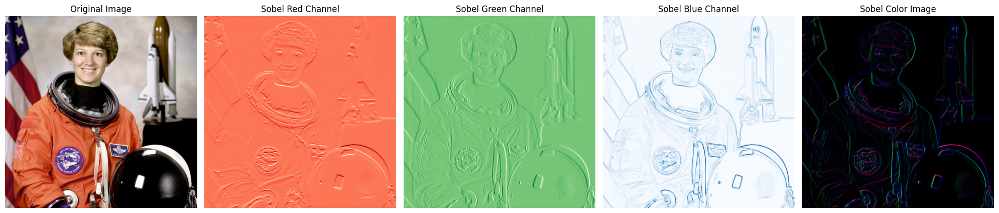

In [90]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()

ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title('Sobel Red Channel')
ax[1].axis('off')

ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title('Sobel Green Channel')
ax[2].axis('off')

ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title('Sobel Blue Channel')
ax[3].axis('off')

ax[4].imshow(sobel_color)
ax[4].set_title('Sobel Color Image')
ax[4].axis('off')

plt.tight_layout()
plt.show()

##P2. Deteksi Tepi dengan operator Roberts

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

In [92]:
image_gray = data.coins()
roberts_gray = filters.roberts(image_gray)

In [93]:
image_color = data.astronaut()

red_channel = image_color[:, :, 0]
green_channel = image_color[:, :, 1]
blue_channel = image_color[:, :, 2]

roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)

roberts_color = np.stack((roberts_red, roberts_green, roberts_blue), axis=2)

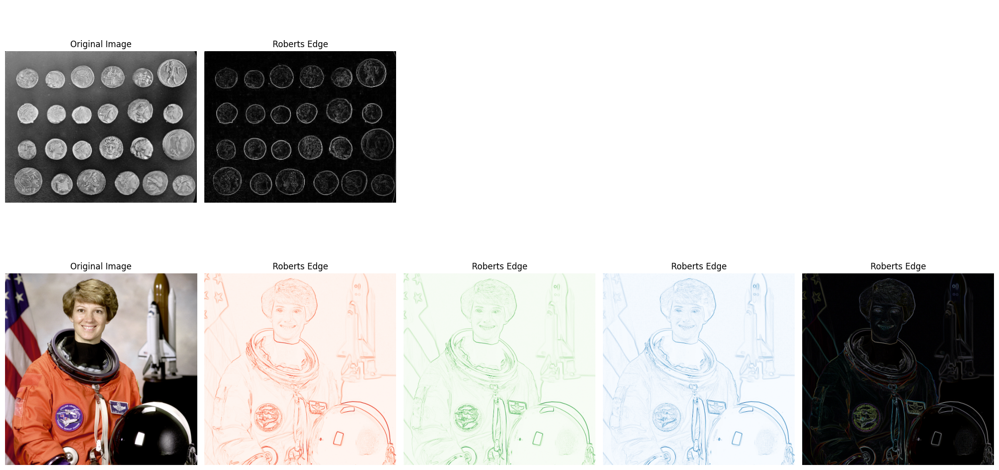

In [94]:
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
ax = axes.ravel()

ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(roberts_gray, cmap='gray')
ax[1].set_title('Roberts Edge')
ax[1].axis('off')

for i in range(2, 5):
  ax[i].axis("off")

ax[5].imshow(image_color)
ax[5].set_title('Original Image')
ax[5].axis('off')

ax[6].imshow(roberts_red, cmap='Reds')
ax[6].set_title('Roberts Edge')
ax[6].axis('off')

ax[7].imshow(roberts_green, cmap='Greens')
ax[7].set_title('Roberts Edge')
ax[7].axis('off')

ax[8].imshow(roberts_blue, cmap='Blues')
ax[8].set_title('Roberts Edge')
ax[8].axis('off')

ax[9].imshow(roberts_color)
ax[9].set_title('Roberts Edge')
ax[9].axis('off')

plt.tight_layout()
plt.show()

##P3. Perbandingan deteksi tepi dengan beberapa operator pada citra grayscale

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

In [96]:
image_gray = data.coins()

In [97]:
# Operator Sobel
sobel_edge = filters.sobel(image_gray)

# Operator Roberts
roberts_edge = filters.roberts(image_gray)

# Operator Prewitt
prewitt_edge = filters.prewitt(image_gray)

# Operator Kirsch (Menggunakan filter gradien berbasis morfologi)
kirsch_edge = gradient(image_gray, disk(1))

# Operator Canny
canny_edge = feature.canny(image_gray, sigma=1)

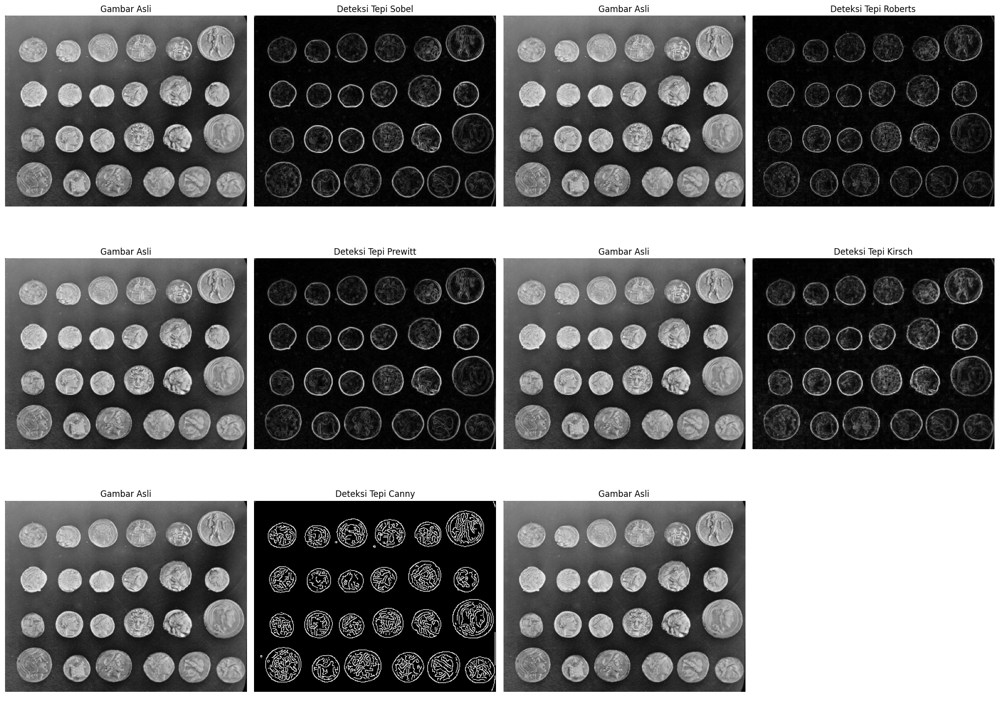

In [98]:
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# Baris 1: Gambar Asli - Sobel
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel_edge, cmap='gray')
ax[1].set_title("Deteksi Tepi Sobel")
ax[1].axis("off")

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title("Gambar Asli")
ax[2].axis("off")

ax[3].imshow(roberts_edge, cmap='gray')
ax[3].set_title("Deteksi Tepi Roberts")
ax[3].axis("off")

# Baris 2: Gambar Asli - Prewitt
ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title("Gambar Asli")
ax[4].axis("off")

ax[5].imshow(prewitt_edge, cmap='gray')
ax[5].set_title("Deteksi Tepi Prewitt")
ax[5].axis("off")

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title("Gambar Asli")
ax[6].axis("off")

ax[7].imshow(kirsch_edge, cmap='gray')
ax[7].set_title("Deteksi Tepi Kirsch")
ax[7].axis("off")

# Baris 3: Gambar Asli - Canny
ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title("Gambar Asli")
ax[8].axis("off")

ax[9].imshow(canny_edge, cmap='gray')
ax[9].set_title("Deteksi Tepi Canny")
ax[9].axis("off")

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title("Gambar Asli")
ax[10].axis("off")

# Kosongkan posisi terakhir agar tampilan rapi
ax[11].axis("off")

plt.tight_layout()
plt.show()

##P4. Perbandingan deteksi tepi dengan beberapa operator pada citra

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color, io
from skimage.filters.rank import gradient
from skimage.morphology import disk

In [100]:
image_gray = data.coins()
image_color = data.astronaut()

In [101]:
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

In [102]:
def apply_edge_detection(image, operator):
    """Menerapkan operator deteksi tepi pada setiap kanal warna (R, G, B)."""
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

In [103]:
sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)

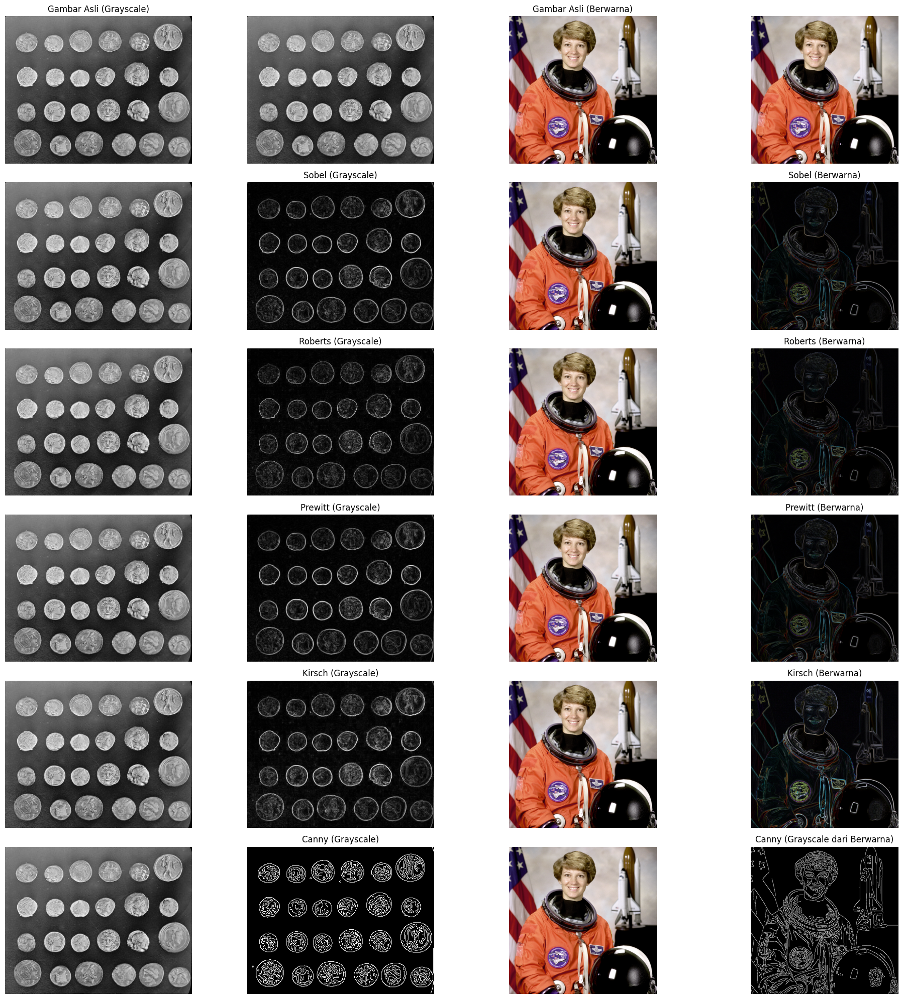

In [104]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

# ----- Baris 1: Gambar Asli -----
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(image_gray, cmap='gray')  # Placeholder
ax[1].axis("off")

ax[2].imshow(image_color)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[2].axis("off")

ax[3].imshow(image_color)  # Placeholder
ax[3].axis("off")

# ----- Baris 2: Sobel -----
ax[4].imshow(image_gray, cmap='gray')
ax[4].axis("off")

ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[5].axis("off")

ax[6].imshow(image_color)
ax[6].axis("off")

ax[7].imshow(sobel_color)
ax[7].set_title("Sobel (Berwarna)")
ax[7].axis("off")

# ----- Baris 3: Roberts -----
ax[8].imshow(image_gray, cmap='gray')
ax[8].axis("off")

ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[9].axis("off")

ax[10].imshow(image_color)
ax[10].axis("off")

ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")
ax[11].axis("off")

# ----- Baris 4: Prewitt -----
ax[12].imshow(image_gray, cmap='gray')
ax[12].axis("off")

ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[13].axis("off")

ax[14].imshow(image_color)
ax[14].axis("off")

ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")
ax[15].axis("off")

# ----- Baris 5: Kirsch -----
ax[16].imshow(image_gray, cmap='gray')
ax[16].axis("off")

ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[17].axis("off")

ax[18].imshow(image_color)
ax[18].axis("off")

ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")
ax[19].axis("off")

# ----- Baris 6: Canny -----
ax[20].imshow(image_gray, cmap='gray')
ax[20].axis("off")

ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[21].axis("off")

ax[22].imshow(image_color)
ax[22].axis("off")

ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")
ax[23].axis("off")

plt.tight_layout()
plt.show()

In [125]:
image_test = io.imread("ini rumah.jpeg")

In [126]:
def apply_edge_detection(image, operator):
    """Menerapkan operator deteksi tepi pada setiap kanal warna (R, G, B)."""
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

In [127]:
sobel_color = apply_edge_detection(image_test, filters.sobel)
roberts_color = apply_edge_detection(image_test, filters.roberts)
prewitt_color = apply_edge_detection(image_test, filters.prewitt)
kirsch_color = apply_edge_detection(image_test, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_test), sigma=1)

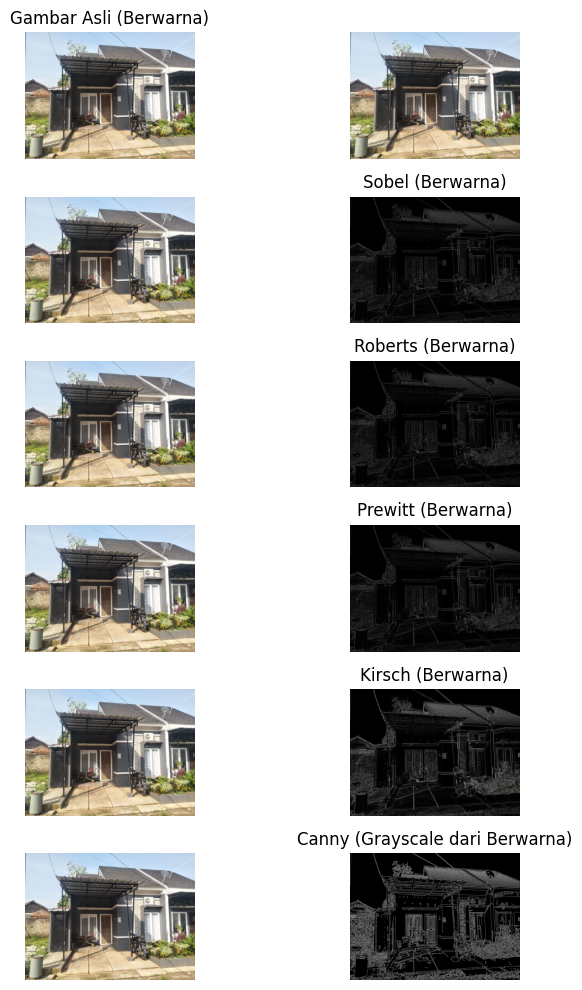

In [128]:
fig, axes = plt.subplots(6, 2, figsize=(8, 10))
ax = axes.ravel()

# ----- Baris 1: Gambar Asli -----
ax[0].imshow(image_test)
ax[0].set_title("Gambar Asli (Berwarna)")
ax[0].axis("off")

ax[1].imshow(image_test)  # Placeholder
ax[1].axis("off")

# ----- Baris 2: Sobel -----
ax[2].imshow(image_test)
ax[2].axis("off")

ax[3].imshow(sobel_color)
ax[3].set_title("Sobel (Berwarna)")
ax[3].axis("off")

# ----- Baris 3: Roberts -----
ax[4].imshow(image_test)
ax[4].axis("off")

ax[5].imshow(roberts_color)
ax[5].set_title("Roberts (Berwarna)")
ax[5].axis("off")

# ----- Baris 4: Prewitt -----
ax[6].imshow(image_test)
ax[6].axis("off")

ax[7].imshow(prewitt_color)
ax[7].set_title("Prewitt (Berwarna)")
ax[7].axis("off")

# ----- Baris 5: Kirsch -----
ax[8].imshow(image_test)
ax[8].axis("off")

ax[9].imshow(kirsch_color)
ax[9].set_title("Kirsch (Berwarna)")
ax[9].axis("off")

# ----- Baris 6: Canny -----
ax[10].imshow(image_test)
ax[10].axis("off")

ax[11].imshow(canny_color, cmap='gray')
ax[11].set_title("Canny (Grayscale dari Berwarna)")
ax[11].axis("off")

plt.tight_layout()
plt.show()